# Introduction

## Importations

In [1]:
import numpy as np
import pandas as pd

import os
import gc
import time

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import kstest, expon
from itertools import product

from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import roc_auc_score, fbeta_score, accuracy_score

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

import pickle
import shap

from evidently.report import Report
from evidently.metric_preset import DataDriftPreset

import warnings
warnings.filterwarnings("ignore")

GRID_SEARCH = True
MLFLOW = True

In [2]:
if MLFLOW :
    
    import mlflow

    mlflow.set_tracking_uri("http://localhost:5000")
    mlflow.set_experiment("oc_projet_7")
    
    def mlflow_save_results(run_name, params = None, metrics = None) :
    
        with mlflow.start_run(run_name = run_name) :

            if params is not None :
                mlflow.log_params(params)

            if metrics is not None :
                for metric, value in metrics.items() :
                    mlflow.log_metric(metric, value)

## Aperçu des données

In [3]:
app_train = pd.read_csv("../csv/application_train.csv")
print("Dimensions :", app_train.shape)
app_train.head()

Dimensions : (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [4]:
app_test = pd.read_csv("../csv/application_test.csv")
print("Dimensions :", app_test.shape)
app_test.head()

Dimensions : (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
def missing_columns(df_1, df_2, name_1 = "df_1", name_2 = "df_2") :
    
    missing_columns = []    
    for column in df_1.columns :
        if column not in df_2.columns :
            missing_columns.append(column)
            
    print(f"Nombre de colonnes de {name_1} qui ne sont pas dans {name_2} :", len(missing_columns))
    
    for column in missing_columns :
        print(column)

In [6]:
missing_columns(app_train, app_test, name_1 = "app_train", name_2 = "app_test")
print()
missing_columns(app_test, app_train, name_1 = "app_test", name_2 = "app_train")

Nombre de colonnes de app_train qui ne sont pas dans app_test : 1
TARGET

Nombre de colonnes de app_test qui ne sont pas dans app_train : 0


## Types des colonnes

In [7]:
print("Nombre de colonnes par type dans app_train :")
print(app_train.dtypes.value_counts())

Nombre de colonnes par type dans app_train :
float64    65
int64      41
object     16
Name: count, dtype: int64


In [8]:
print("Nombre de colonnes par type dans app_test :")
print(app_test.dtypes.value_counts())

Nombre de colonnes par type dans app_test :
float64    65
int64      40
object     16
Name: count, dtype: int64


In [9]:
print("Cardinalité des variables catégorielles de app_train :")
app_train.select_dtypes("object").apply(pd.Series.nunique, axis = 0)

Cardinalité des variables catégorielles de app_train :


NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

## Valeurs manquantes

In [10]:
def missing_values_table(df) :

    count = df.isnull().sum()
    percentage = 100 * df.isnull().sum() / len(df)
        
    table = pd.concat([count, percentage], axis = 1)
    table = table.rename(columns = {0 : "Missing Values", 1 : "Percentage"})
    table = table.loc[table["Missing Values"] != 0]
    table = table.sort_values("Percentage", ascending = False).round(1)

    print("Valeurs manquantes dans", len(table), "des", len(df), "colonnes.")
    
    return table

In [11]:
missing_values_table(app_train).head(10)

Valeurs manquantes dans 67 des 307511 colonnes.


,Missing Values,Percentage
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


## Distribution de la cible

In [12]:
target_count = app_train["TARGET"].value_counts()
print(target_count)

TARGET
0    282686
1     24825
Name: count, dtype: int64


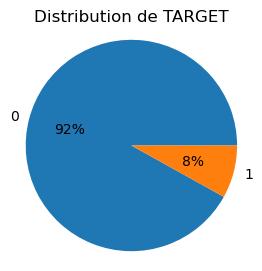

In [13]:
target_count.plot.pie(figsize = (3, 3), autopct = "%1.0f%%")
plt.axis("equal")
plt.ylabel("")
plt.title("Distribution de TARGET")
plt.show()

## Encodage

In [14]:
def get_low_cardinality_columns(df, max_cardinality) :
    
    categorical = lambda x : df[x].dtype == "object"
    low_cardinality = lambda x : df[x].nunique(dropna = False) <= max_cardinality
    
    return [column for column in df.columns if categorical(column) and low_cardinality(column)]

In [15]:
def encode_categorical(input_df) :
    
    df = input_df.copy()
    
    print("Application du Label Encoder :")
    label_encoder = LabelEncoder()

    for column in get_low_cardinality_columns(df, 2) :
        df[column] = label_encoder.fit_transform(df[column])
        print(column)

    print("\nApplication du Onehot Encoder :")
    df = pd.get_dummies(df)
    print("Le jeu de données a désormais", len(df.columns), "colonnes.")
    
    return df

In [16]:
app_train_encoded = encode_categorical(app_train)

Application du Label Encoder :
NAME_CONTRACT_TYPE
FLAG_OWN_CAR
FLAG_OWN_REALTY

Application du Onehot Encoder :
Le jeu de données a désormais 243 colonnes.


In [17]:
print("Dans app_train :")
for column in get_low_cardinality_columns(app_train, 2) :
    print(column, ":", app_train[column].unique())

print("\nDans app_test :")
for column in get_low_cardinality_columns(app_test, 2) :
    print(column, ":", app_test[column].unique())

Dans app_train :
NAME_CONTRACT_TYPE : ['Cash loans' 'Revolving loans']
FLAG_OWN_CAR : ['N' 'Y']
FLAG_OWN_REALTY : ['Y' 'N']

Dans app_test :
NAME_CONTRACT_TYPE : ['Cash loans' 'Revolving loans']
CODE_GENDER : ['F' 'M']
FLAG_OWN_CAR : ['N' 'Y']
FLAG_OWN_REALTY : ['Y' 'N']


In [18]:
code_gender_encoded = pd.get_dummies(app_test['CODE_GENDER'], prefix = "CODE_GENDER")
code_gender_encoded["CODE_GENDER_XNA"] = False
app_test_encoded = pd.concat([app_test.drop("CODE_GENDER", axis = 1), code_gender_encoded], axis = 1)

In [19]:
app_test_encoded = encode_categorical(app_test_encoded)

Application du Label Encoder :
NAME_CONTRACT_TYPE
FLAG_OWN_CAR
FLAG_OWN_REALTY

Application du Onehot Encoder :
Le jeu de données a désormais 240 colonnes.


In [20]:
missing_columns(app_train_encoded, app_test_encoded, name_1 = "app_train_encoded", name_2 = "app_test_encoded")
print()
missing_columns(app_test_encoded, app_train_encoded, name_1 = "app_test_encoded", name_2 = "app_train_encoded")

Nombre de colonnes de app_train_encoded qui ne sont pas dans app_test_encoded : 3
TARGET
NAME_INCOME_TYPE_Maternity leave
NAME_FAMILY_STATUS_Unknown

Nombre de colonnes de app_test_encoded qui ne sont pas dans app_train_encoded : 0


In [21]:
app_test_encoded["NAME_INCOME_TYPE_MATERNITY_LEAVE"] = False
app_test_encoded["NAME_FAMILY_STATUS_UNKNOWN"] = False

# Analyse exploratoire

In [22]:
df = app_train_encoded.copy()

## Anomalies

In [23]:
(df["DAYS_BIRTH"] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [24]:
df["DAYS_EMPLOYED"].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [25]:
def plot_histogram(df, feature, label, bins, figsize) :

    df[feature].plot.hist(
        figsize = figsize,
        title = f"Distribution de {feature}",
        edgecolor = "k",
        bins = bins
    )

    plt.xlabel(label)
    plt.ylabel("Effectif")
    plt.show()

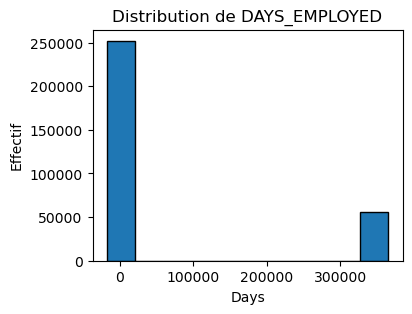

In [26]:
plot_histogram(df, "DAYS_EMPLOYED", "Days", 10, (4, 3))

In [27]:
anom = df[df["DAYS_EMPLOYED"] > 40000]
non_anom = df[df["DAYS_EMPLOYED"] <= 40000]

default_anom = round(100 * anom["TARGET"].mean(), 1)
default_non_anom = round(100 * non_anom["TARGET"].mean(), 1)

print("Nombre d'entrées anormales :", len(anom), "sur", len(df))
print("Défaut de remboursement pour les entrées normales :", default_non_anom, "%")
print("Défaut de remboursement pour les entrées anormales :", default_anom, "%")

Nombre d'entrées anormales : 55374 sur 307511
Défaut de remboursement pour les entrées normales : 8.7 %
Défaut de remboursement pour les entrées anormales : 5.4 %


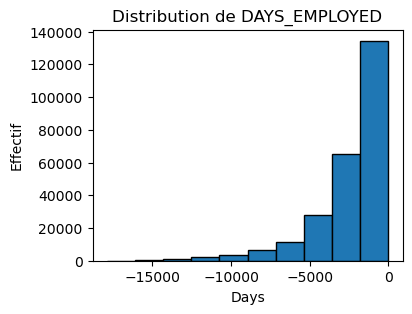

In [28]:
df["DAYS_EMPLOYED_ANOM"] = (df["DAYS_EMPLOYED"] > 40000)
df.loc[df["DAYS_EMPLOYED"] > 40000, "DAYS_EMPLOYED"] = np.nan

plot_histogram(df, "DAYS_EMPLOYED", "Days", 10, (4, 3))

In [29]:
with_negative = df.columns[(df < 0).any()]

print("Features ayant au moins une valeur négative :")
print(with_negative.tolist())

only_negative = [column for column in df.columns if not (df[column] > 0).any()]

print("\nFeatures n'ayant que des valeurs négatives :")
print(only_negative)

Features ayant au moins une valeur négative :
['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']

Features n'ayant que des valeurs négatives :
['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'DAYS_LAST_PHONE_CHANGE']


In [30]:
for feature in only_negative :
    df[feature] *= -1

## Corrélations

In [31]:
start_time = time.time()

correlations = df.corr()["TARGET"]

duration = round(time.time() - start_time, 3)
print("Temps pour calculer les corrélations :", duration, "secondes")

Temps pour calculer les corrélations : 39.927 secondes


In [32]:
print("Meilleurs correlations positives")
print(correlations.sort_values(ascending = False).head(10))

print("\nMeilleurs correlations négatives")
print(correlations.sort_values().head(10))

Meilleurs correlations positives
TARGET                                               1.000000
REGION_RATING_CLIENT_W_CITY                          0.060893
REGION_RATING_CLIENT                                 0.058899
NAME_INCOME_TYPE_Working                             0.057481
CODE_GENDER_M                                        0.054713
REG_CITY_NOT_WORK_CITY                               0.050994
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
FLAG_EMP_PHONE                                       0.045982
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_DOCUMENT_3                                      0.044346
Name: TARGET, dtype: float64

Meilleurs correlations négatives
EXT_SOURCE_3                           -0.178919
EXT_SOURCE_2                           -0.160472
EXT_SOURCE_1                           -0.155317
DAYS_BIRTH                             -0.078239
DAYS_EMPLOYED                          -0.074958
NAME_EDUCATION_TYPE_Higher education   

## Impact de l'âge

In [33]:
age_data = df[["TARGET", "DAYS_BIRTH"]].copy()
age_data["DAYS_BIRTH"] = abs(age_data["DAYS_BIRTH"])

age_corr = age_data["DAYS_BIRTH"].corr(age_data["TARGET"])
print("Corrélation entre l'âge et la cible :", age_corr)

Corrélation entre l'âge et la cible : -0.07823930830982692


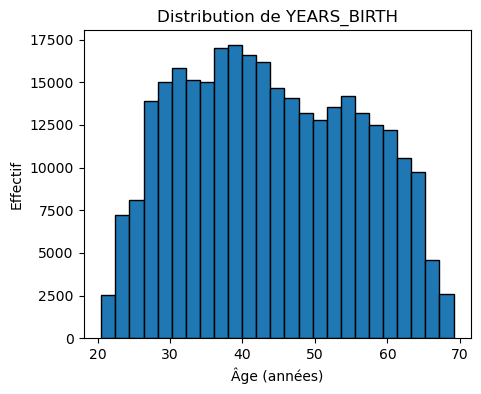

In [34]:
age_data["YEARS_BIRTH"] = age_data["DAYS_BIRTH"] / 365
plot_histogram(age_data, "YEARS_BIRTH", "Âge (années)", 25, (5, 4))

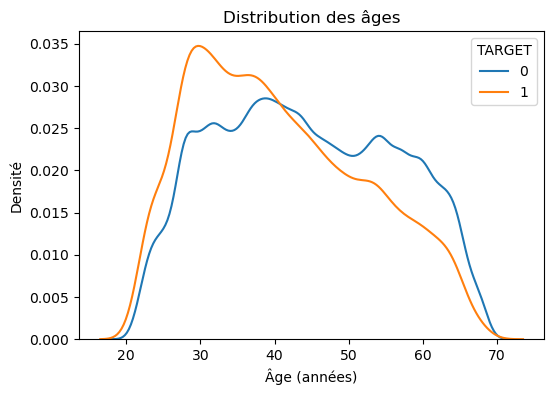

In [35]:
plt.figure(figsize = (6, 4))

sns.kdeplot(age_data.loc[age_data["TARGET"] == 0, "YEARS_BIRTH"], label = "0")
sns.kdeplot(age_data.loc[age_data["TARGET"] == 1, "YEARS_BIRTH"], label = "1")

plt.xlabel("Âge (années)")
plt.ylabel("Densité")
plt.title("Distribution des âges")
plt.legend(title = "TARGET")
plt.show()

In [36]:
age_data["YEARS_BINNED"] = pd.cut(age_data["YEARS_BIRTH"],
                                  bins = np.linspace(20, 70, num = 11))

age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [37]:
age_groups = age_data.groupby("YEARS_BINNED").mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


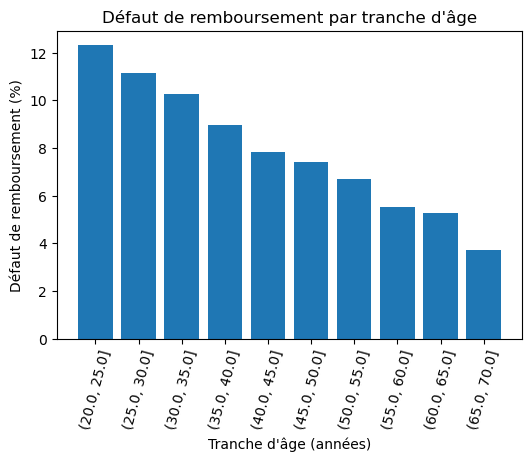

In [38]:
plt.figure(figsize = (6, 4))

plt.bar(age_groups.index.astype(str), 100 * age_groups["TARGET"])

plt.xticks(rotation = 75)
plt.xlabel("Tranche d'âge (années)")
plt.ylabel("Défaut de remboursement (%)")
plt.title("Défaut de remboursement par tranche d'âge")
plt.show()

## Sources extérieures

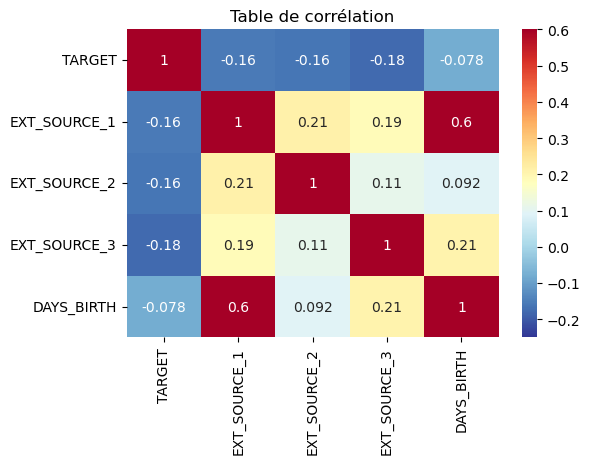

In [39]:
ext_data = df[["TARGET", "EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3", "DAYS_BIRTH"]]
ext_data["DAYS_BIRTH"] = abs(ext_data["DAYS_BIRTH"])

plt.figure(figsize = (6, 4))
sns.heatmap(ext_data.corr(), cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title("Table de corrélation")
plt.show()

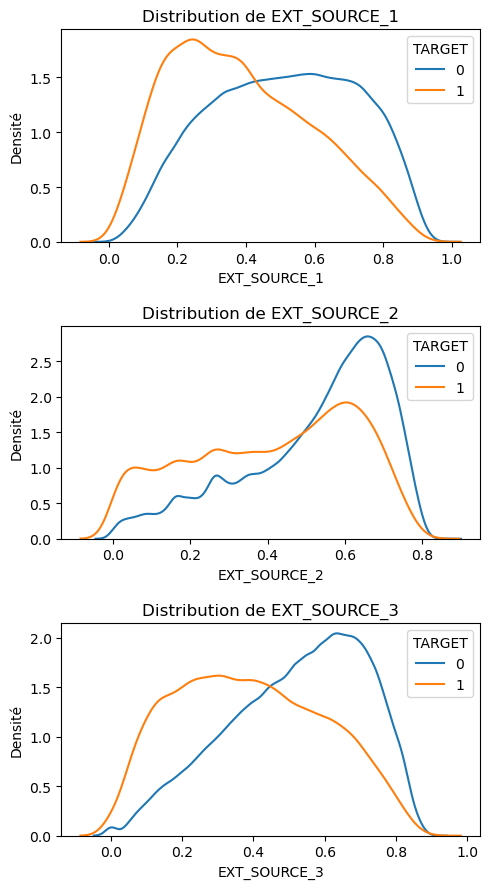

In [40]:
plt.figure(figsize = (5, 9))

for i, source in enumerate(["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"]) :

    plt.subplot(3, 1, i + 1)
    
    sns.kdeplot(ext_data.loc[ext_data["TARGET"] == 0, source], label = "0")
    sns.kdeplot(ext_data.loc[ext_data["TARGET"] == 1, source], label = "1")
    
    plt.title(f"Distribution de {source}")
    plt.xlabel(source)
    plt.ylabel("Densité")
    plt.legend(title = "TARGET")
    
plt.tight_layout(h_pad = 1.5)

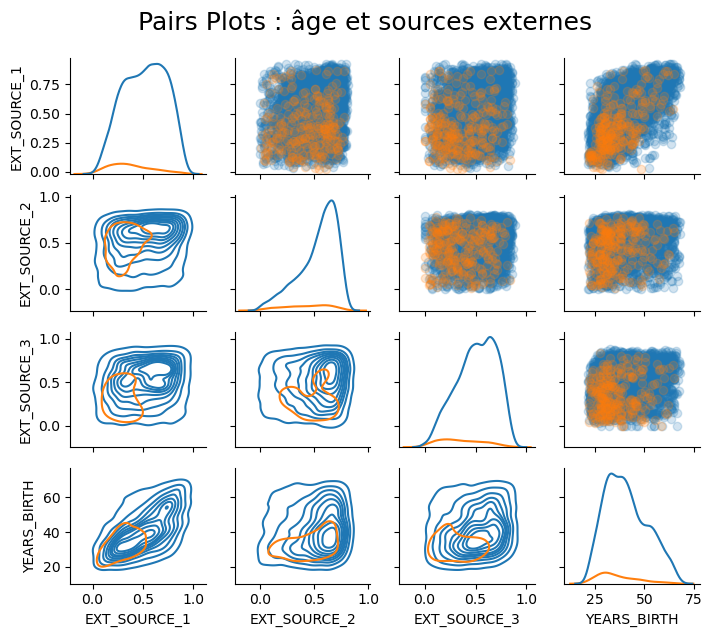

In [41]:
def corr_func(x, y, **kwargs) :
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy = (.2, .8), xycoords = ax.transAxes, size = 20)

plot_data = ext_data.drop(columns = ["DAYS_BIRTH"]).copy()
plot_data["YEARS_BIRTH"] = age_data["YEARS_BIRTH"]
plot_data = plot_data.dropna().loc[:10000, :]

grid = sns.PairGrid(data = plot_data, diag_sharey = False, hue = "TARGET",
                    vars = [x for x in list(plot_data.columns) if x != "TARGET"],
                    height = 1.5, aspect = 1.2)

grid.map_upper(plt.scatter, alpha = 0.2)
grid.map_diag(sns.kdeplot)
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r)

plt.suptitle("Pairs Plots : âge et sources externes", size = 18, y = 1.05)
plt.show()

## Création de ratios

In [42]:
def create_ratios(input_df) :
    
    df = input_df.copy()
    
    df["CREDIT_INCOME_PERCENT"] = df["AMT_CREDIT"] / df["AMT_INCOME_TOTAL"]
    df["ANNUITY_INCOME_PERCENT"] = df["AMT_ANNUITY"] / df["AMT_INCOME_TOTAL"]
    df["CREDIT_TERM"] = df["AMT_ANNUITY"] / df["AMT_CREDIT"]
    df["DAYS_EMPLOYED_PERCENT"] = df["DAYS_EMPLOYED"] / df["DAYS_BIRTH"]
    
    return df

In [43]:
df = create_ratios(df)

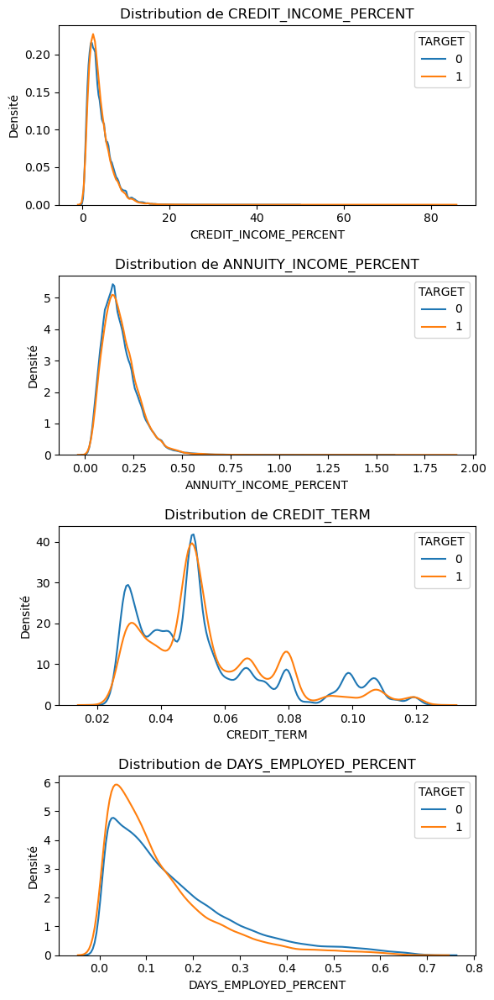

In [44]:
plt.figure(figsize = (6, 12))

features = ["CREDIT_INCOME_PERCENT", "ANNUITY_INCOME_PERCENT", "CREDIT_TERM", "DAYS_EMPLOYED_PERCENT"]

for i, feature in enumerate(features) :
    
    plt.subplot(4, 1, i + 1)
    
    sns.kdeplot(df.loc[df["TARGET"] == 0, feature], label = "0")
    sns.kdeplot(df.loc[df["TARGET"] == 1, feature], label = "1")

    plt.title(f"Distribution de {feature}")
    plt.xlabel(feature)
    plt.ylabel("Densité")
    plt.legend(title = "TARGET")
    
plt.tight_layout(h_pad = 1.5)

# Modélisation

## Séparation des données

In [45]:
print(df.dtypes.value_counts().to_string())

bool       135
float64     70
int64       40
int32        3


In [46]:
for column in df.columns :
        if df[column].dtype in ["int32", "bool"] :
            df[column] = df[column].astype("int64")
            
print(df.dtypes.value_counts().to_string())

int64      178
float64     70


In [47]:
def clean_column_names(column_name) :
    
    # Suppression de sous-chaînes :
    for c in [" Entity Type", ": type", " /", ","] :
        column_name = column_name.replace(c, "")
    
    # Remplacement "Co-op" par "Coop"
    column_name = column_name.replace("Co-op", "Coop")
    
    # Remplacement des caractères spéciaux par "_"
    for c in " .,:/\\|@#$%^&*()-+=[]{}<>?!`~\'" :
        column_name = column_name.replace(c, "_")

    # Passage en majuscules
    return column_name.upper()

In [48]:
df.columns = [clean_column_names(column) for column in df.columns]

In [49]:
df_train, df_test = train_test_split(df, test_size = 0.2, stratify = df["TARGET"], random_state = 42)

df_train.reset_index(drop = True, inplace = True)
df_test.reset_index(drop = True, inplace = True)

print("--- Séparation du jeu de données ---")
print("Dimensions du jeu d'entraînement :", df_train.shape)
print("Dimensions du jeu de test :", df_test.shape)

del app_train, app_train_encoded, df, app_test

--- Séparation du jeu de données ---
Dimensions du jeu d'entraînement : (246008, 248)
Dimensions du jeu de test : (61503, 248)


## Choix de la métrique

In [50]:
def rge_score(labels, binary_preds, credit_amounts, interest_ratio = 0.1) :
    
    expected_gain = 0
    effective_gain = 0
    
    for label, pred, credit_amount in zip(labels, binary_preds, credit_amounts) :
        if label == 0 :
            expected_gain += interest_ratio * credit_amount
            if pred == 0 :
                effective_gain += interest_ratio * credit_amount
        if label == 1 and pred == 0 :
            effective_gain -= credit_amount
            
    return effective_gain / expected_gain

In [51]:
def dummy_classifier(X_train, X_test, y_train, y_test, strategy, mlflow = False) :
    
    dummy = DummyClassifier(strategy = strategy)
    dummy.fit(X_train, y_train)
       
    proba_preds_train = dummy.predict_proba(X_train)[:, 1]
    proba_preds_test = dummy.predict_proba(X_test)[:, 1]   
    binary_preds_train = dummy.predict(X_train)
    binary_preds_test = dummy.predict(X_test)
    
    metrics = {}
    metrics["auroc_train"] = roc_auc_score(y_train, proba_preds_train)
    metrics["auroc_test"] = roc_auc_score(y_test, proba_preds_test)
    metrics["rge_train"] = rge_score(y_train, binary_preds_train, X_train["AMT_CREDIT"])
    metrics["rge_test"] = rge_score(y_test, binary_preds_test, X_test["AMT_CREDIT"])
    
    print(f"--- Dummy classifier ({strategy}) ---")
    print("Score AUROC (train) :", round(metrics["auroc_train"], 5))
    print("Score AUROC (test) :", round(metrics["auroc_test"], 5))
    print("Score RGE (train) :", round(metrics["rge_train"], 5))
    print("Score RGE (test) :", round(metrics["rge_test"], 5))
    
    if MLFLOW :
        name = f"Dummy Classifier ({strategy})"
        mlflow_save_results(name, params = {"strategy" : strategy}, metrics = metrics)

In [52]:
X_train = df_train.drop(columns = ["TARGET"])
X_test = df_test.drop(columns = ["TARGET"])
y_train = df_train["TARGET"]
y_test = df_test["TARGET"]

for strategy in ["uniform", "stratified", "most_frequent"] :
    dummy_classifier(X_train, X_test, y_train, y_test, strategy, mlflow = True)
    print()

del X_train, X_test, y_train, y_test

--- Dummy classifier (uniform) ---
Score AUROC (train) : 0.5
Score AUROC (test) : 0.5
Score RGE (train) : 0.09725
Score RGE (test) : 0.09802

--- Dummy classifier (stratified) ---
Score AUROC (train) : 0.49777
Score AUROC (test) : 0.49906
Score RGE (train) : 0.17223
Score RGE (test) : 0.17327

--- Dummy classifier (most_frequent) ---
Score AUROC (train) : 0.5
Score AUROC (test) : 0.5
Score RGE (train) : 0.18813
Score RGE (test) : 0.18347



## Régression logistique

In [53]:
def preprocess_data(df_train, df_test, selected_features) :
    
    # Extraction des features avec copie
    data = {
        "X_train" : df_train[selected_features].copy(),
        "X_test" : df_test[selected_features].copy(),
        "y_train" : df_train["TARGET"].copy(),
        "y_test" : df_test["TARGET"].copy(),
        "amt_credit_train" : df_train["AMT_CREDIT"].copy(),
        "amt_credit_test" : df_test["AMT_CREDIT"].copy()
    }
    
    # Abandon des éventuelles colonnes n'ayant qu'une seule valeur
    columns_to_drop = data["X_train"].columns[data["X_train"].nunique() == 1]
    X_train_cleaned = data["X_train"].drop(columns = columns_to_drop)
    X_test_cleaned = data["X_test"].drop(columns = columns_to_drop)
    
    # Imputation des valeurs manquantes par la médiane
    imputer = SimpleImputer(strategy = "median")
    X_train_imputed = imputer.fit_transform(X_train_cleaned)
    X_test_imputed = imputer.transform(X_test_cleaned)
    
    # Normalisation des valeurs
    scaler = MinMaxScaler()
    X_train_scaled = scaler.fit_transform(X_train_imputed)
    X_test_scaled = scaler.transform(X_test_imputed)
    
    # Réattribution des noms des colonnes
    data["X_train"] = pd.DataFrame(X_train_scaled, columns = X_train_cleaned.columns)
    data["X_test"] = pd.DataFrame(X_test_scaled, columns = X_test_cleaned.columns)
    
    return data

In [54]:
gc.collect()

start_time = time.time()

selected_features = list(df_train.columns)
selected_features.remove("TARGET")
selected_features.remove("SK_ID_CURR")

processed_data = preprocess_data(df_train, df_test, selected_features)

preprocessing_time = time.time() - start_time
print("Temps de prétraitement :", round(preprocessing_time, 3), "seconde(s)")

for name, df in processed_data.items() :
    print(name, ":", df.shape)

Temps de prétraitement : 8.418 seconde(s)
X_train : (246008, 246)
X_test : (61503, 246)
y_train : (246008,)
y_test : (61503,)
amt_credit_train : (246008,)
amt_credit_test : (61503,)


In [55]:
# Entraînement
logreg = LogisticRegression()
logreg.fit(processed_data["X_train"], processed_data["y_train"])

# Prédictions
proba_preds_train = logreg.predict_proba(processed_data["X_train"])[:, 1]
proba_preds_test = logreg.predict_proba(processed_data["X_test"])[:, 1]
binary_preds_train = logreg.predict(processed_data["X_train"])
binary_preds_test = logreg.predict(processed_data["X_test"])

# Evaluation
metrics = {
    "auroc_train" : roc_auc_score(processed_data["y_train"], proba_preds_train),
    "auroc_test" : roc_auc_score(processed_data["y_test"], proba_preds_test),
    "rge_train" :rge_score(processed_data["y_train"], binary_preds_train, processed_data["amt_credit_train"]),
    "rge_test" : rge_score(processed_data["y_test"], binary_preds_test, processed_data["amt_credit_test"])
}

# Affichage des résultats
print("--- Régression logistique ---")
print("Score AUROC (train) :", round(metrics["auroc_train"], 5))
print("Score AUROC (test) :", round(metrics["auroc_test"], 5))
print("Score RGE (train) :", round(metrics["rge_train"], 5))
print("Score RGE (test) :", round(metrics["rge_test"], 5))

--- Régression logistique ---
Score AUROC (train) : 0.74831
Score AUROC (test) : 0.74869
Score RGE (train) : 0.19614
Score RGE (test) : 0.19091


In [56]:
binary_preds_train = (proba_preds_train >= 0.5).astype(int)
binary_preds_test = (proba_preds_test >= 0.5).astype(int)

rge_train = rge_score(processed_data["y_train"], binary_preds_train, processed_data["amt_credit_train"])
rge_test = rge_score(processed_data["y_test"], binary_preds_test, processed_data["amt_credit_test"])

print("--- LogisticRegression ---")
print("Seuil d'acceptation : 0.5")
print(f"Score RGE sur le jeu d'entraînement : {round(rge_train, 5)}")
print(f"Score RGE sur le jeu de test : {round(rge_test, 5)}")

if MLFLOW :
    metrics["acceptance"] = 0.5
    mlflow_save_results("Logistic Regression (acceptance 0.5)", metrics = metrics)

--- LogisticRegression ---
Seuil d'acceptation : 0.5
Score RGE sur le jeu d'entraînement : 0.19614
Score RGE sur le jeu de test : 0.19091


In [57]:
binary_preds_train = (proba_preds_train >= 0.2).astype(int)
binary_preds_test = (proba_preds_test >= 0.2).astype(int)

rge_train = rge_score(processed_data["y_train"], binary_preds_train, processed_data["amt_credit_train"])
rge_test = rge_score(processed_data["y_test"], binary_preds_test, processed_data["amt_credit_test"])

print("--- LogisticRegression ---")
print("Seuil d'acceptation : 0.2")
print(f"Score RGE sur le jeu d'entraînement : {round(rge_train, 5)}")
print(f"Score RGE sur le jeu de test : {round(rge_test, 5)}")

if MLFLOW :
    metrics["acceptance"] = 0.2
    mlflow_save_results("Logistic Regression (acceptance 0.2)", metrics = metrics)

--- LogisticRegression ---
Seuil d'acceptation : 0.2
Score RGE sur le jeu d'entraînement : 0.32931
Score RGE sur le jeu de test : 0.33703


In [58]:
def get_rge_by_acceptance(labels, proba_preds, credit_amounts) :
    
    acceptance_values = np.linspace(0, 1, 100)
    rge_values = []
    
    for acceptance in acceptance_values :
        binary_preds = (proba_preds >= acceptance).astype(int)
        rge = rge_score(labels, binary_preds, credit_amounts)
        rge_values.append(rge)
    
    return acceptance_values, rge_values

In [59]:
def plot_rge_by_acceptance(acceptance_values, rge_values) :
    
    plt.figure(figsize = (5, 3))
    plt.plot(acceptance_values, rge_values)
    
    plt.xlabel("Seuil d'acceptation")
    plt.ylabel(f"Score RGE")
    plt.title("Score RGE par seuil d'acceptation")
    plt.grid(True)
    
    plt.show()

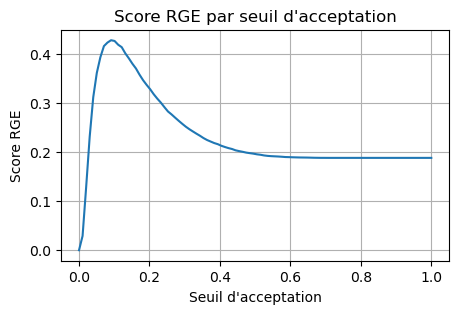

In [60]:
acceptance_values, rge_values = get_rge_by_acceptance(
    labels = processed_data["y_train"],
    proba_preds = proba_preds_train,
    credit_amounts = processed_data["amt_credit_train"]
)

plot_rge_by_acceptance(acceptance_values, rge_values)

In [61]:
best_index = np.argmax(rge_values)
best_acceptance = acceptance_values[best_index]
binary_preds_test = (proba_preds_test >= best_acceptance).astype(int)

rge_train = rge_values[best_index]
rge_test = rge_score(processed_data["y_test"], binary_preds_test, processed_data["amt_credit_test"])

print("Seuil d'acceptation optimal :", round(best_acceptance, 2))
print(f"Score RGE sur le jeu d'entraînement : {round(rge_train, 5)}")
print(f"Score RGE sur le jeu de test : {round(rge_test, 5)}")

del proba_preds_train, proba_preds_test, binary_preds_train, binary_preds_test, acceptance_values, rge_values

Seuil d'acceptation optimal : 0.09
Score RGE sur le jeu d'entraînement : 0.42781
Score RGE sur le jeu de test : 0.43241


## Méthodes d'équilibrage

In [62]:
def balance_data(processed_data, strategy = None) :
    
    # Copie des données fournies en argument
    data = {name : df.copy() for name, df in processed_data.items()}
   
    # Sélection du sampler suivant la stratégie d'équilibrage
    if strategy == "over" :
        sampler = RandomOverSampler(random_state = 42)        
    elif strategy == "under" :
        sampler = RandomUnderSampler(random_state = 42)
    elif strategy == "smote" :
        sampler = SMOTE(random_state = 42)
    else :
        # Simple recopie dans le cas sans équilibrage
        data["X_train_balanced"] = data["X_train"]
        data["y_train_balanced"] = data["y_train"]
        return data
    
    # Ajout temporaire des montants des crédits à X_train
    data["X_train"]["temp"] = data["amt_credit_train"].copy()
    
    # Application du sampler
    data["X_train_balanced"], data["y_train_balanced"] = sampler.fit_resample(data["X_train"], data["y_train"])
    
    # Récupération du montants des crédits
    data["amt_credit_train"] = data["X_train_balanced"].pop("temp")
    data["X_train"].drop(columns = ["temp"], inplace = True)
        
    return data

In [63]:
gc.collect()

preprocessing_times = {}

print("--- Standard ---")
start_time = time.time()
data_standard = balance_data(processed_data)
preprocessing_times["standard"] = preprocessing_time + time.time() - start_time
for name, df in data_standard.items() :
    print(name, ":", df.shape)

print("\n--- Oversampling ---")
start_time = time.time()
data_over = balance_data(processed_data, strategy = "over")
preprocessing_times["oversampling"] = preprocessing_time + time.time() - start_time
for name, df in data_over.items() :
    print(name, ":", df.shape)
    
print("\n--- Undersampling ---")
start_time = time.time()
data_under = balance_data(processed_data, strategy = "under")
preprocessing_times["undersampling"] = preprocessing_time + time.time() - start_time
for name, df in data_under.items() :
    print(name, ":", df.shape)
    
print("\n--- SMOTE ---")
start_time = time.time()
data_smote = balance_data(processed_data, strategy = "smote")
preprocessing_times["smote"] = preprocessing_time + time.time() - start_time
for name, df in data_smote.items() :
    print(name, ":", df.shape)

del processed_data

--- Standard ---
X_train : (246008, 246)
X_test : (61503, 246)
y_train : (246008,)
y_test : (61503,)
amt_credit_train : (246008,)
amt_credit_test : (61503,)
X_train_balanced : (246008, 246)
y_train_balanced : (246008,)

--- Oversampling ---
X_train : (246008, 246)
X_test : (61503, 246)
y_train : (246008,)
y_test : (61503,)
amt_credit_train : (452296,)
amt_credit_test : (61503,)
X_train_balanced : (452296, 246)
y_train_balanced : (452296,)

--- Undersampling ---
X_train : (246008, 246)
X_test : (61503, 246)
y_train : (246008,)
y_test : (61503,)
amt_credit_train : (39720,)
amt_credit_test : (61503,)
X_train_balanced : (39720, 246)
y_train_balanced : (39720,)

--- SMOTE ---
X_train : (246008, 246)
X_test : (61503, 246)
y_train : (246008,)
y_test : (61503,)
amt_credit_train : (452296,)
amt_credit_test : (61503,)
X_train_balanced : (452296, 246)
y_train_balanced : (452296,)


In [64]:
def apply_classifier(data, classifier) :
    
    start_time = time.time()
    classifier.fit(data["X_train_balanced"], data["y_train_balanced"])
    training_time = time.time() - start_time

    start_time = time.time()
    
    preds = {
        "proba_train" : classifier.predict_proba(data["X_train"])[:, 1],
        "proba_test" : classifier.predict_proba(data["X_test"])[:, 1]
    }

    acceptance_values, rge_values = get_rge_by_acceptance(data["y_train"], preds["proba_train"], data["amt_credit_train"])
    
    preds["acceptance_curve"] = (acceptance_values, rge_values)
    preds["acceptance"] = acceptance_values[np.argmax(rge_values)]
    
    preds["binary_train"] = (preds["proba_train"] >= preds["acceptance"]).astype(int)
    preds["binary_test"] = (preds["proba_test"] >= preds["acceptance"]).astype(int)
    
    prediction_time = time.time() - start_time

    return preds, training_time, prediction_time

In [65]:
def evaluate_preds(data, preds, display_results = True, display_curve = False) :
        
    metrics = {}
    metrics["auroc_train"] = roc_auc_score(data["y_train"], preds["proba_train"])
    metrics["auroc_test"] = roc_auc_score(data["y_test"], preds["proba_test"])
    metrics["rge_train"] = rge_score(data["y_train"], preds["binary_train"], data["amt_credit_train"])
    metrics["rge_test"] = rge_score(data["y_test"], preds["binary_test"], data["amt_credit_test"])
    
    if display_results :   
        print("Score AUROC (train) :", round(metrics["auroc_train"], 5))
        print("Score AUROC (test) :", round(metrics["auroc_test"], 5))
        print("Seuil d'acceptation :", round(preds["acceptance"], 2))
        print("Score RGE (train) :", round(metrics["rge_train"], 5))
        print("Score RGE (test) :", round(metrics["rge_test"], 5))
    
    if display_curve :
        acceptance_values, rge_values = preds["acceptance_curve"]
        plot_rge_by_acceptance(acceptance_values, rge_values)
        
    return metrics

In [66]:
def apply_logistic_regression(data, balancing, preprocessing_times, results) :

    logreg = LogisticRegression()
    preds, training_time, prediction_time = apply_classifier(data, logreg)

    print(f"--- LogisticRegression ({balancing}) ---")
    metrics = evaluate_preds(data, preds, display_curve = True)

    metrics["preprocessing_time"] = preprocessing_times[balancing]
    metrics["training_time"] = training_time
    metrics["prediction_time"] = prediction_time

    new_row = {
        "name" : "logistic_regression",
        "classifier" : logreg,
        "balancing" : balancing,
        "acceptance" : preds["acceptance"]
    }

    for (metric, value) in metrics.items() :
        new_row[metric] = value
    
    results.append(new_row)

    if MLFLOW :
        params = {"balancing" : balancing, "acceptance" : preds["acceptance"]}
        mlflow_save_results(f"Logistic Regression ({balancing})", params = params, metrics = metrics)

--- LogisticRegression (standard) ---
Score AUROC (train) : 0.74831
Score AUROC (test) : 0.74869
Seuil d'acceptation : 0.09
Score RGE (train) : 0.42781
Score RGE (test) : 0.43241


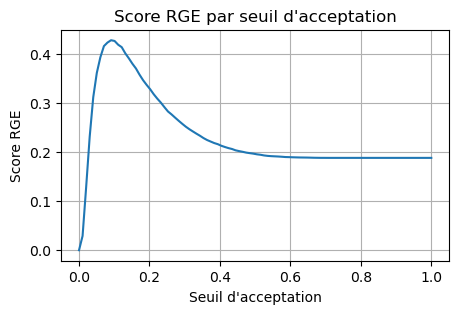

In [67]:
results = [] 
apply_logistic_regression(data_standard, "standard", preprocessing_times, results)

--- LogisticRegression (oversampling) ---
Score AUROC (train) : 0.74911
Score AUROC (test) : 0.74902
Seuil d'acceptation : 0.56
Score RGE (train) : 0.42808
Score RGE (test) : 0.4301


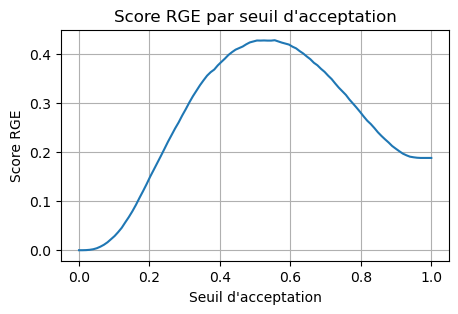

In [68]:
apply_logistic_regression(data_over, "oversampling", preprocessing_times, results)

--- LogisticRegression (undersampling) ---
Score AUROC (train) : 0.7477
Score AUROC (test) : 0.74811
Seuil d'acceptation : 0.51
Score RGE (train) : 0.40732
Score RGE (test) : 0.43057


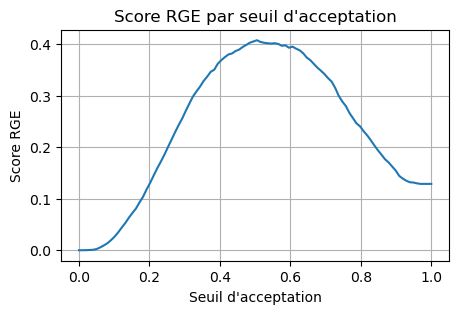

In [69]:
apply_logistic_regression(data_under, "undersampling", preprocessing_times, results)

--- LogisticRegression (smote) ---
Score AUROC (train) : 0.74351
Score AUROC (test) : 0.74585
Seuil d'acceptation : 0.56
Score RGE (train) : 0.42149
Score RGE (test) : 0.42605


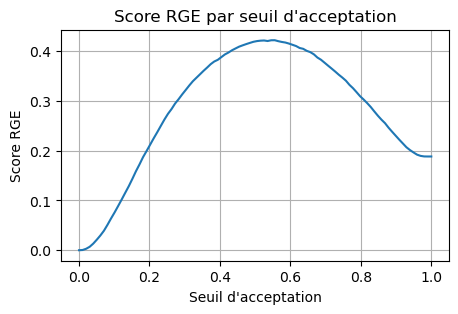

In [70]:
apply_logistic_regression(data_smote, "smote", preprocessing_times, results)

## Random Forest

In [71]:
def apply_random_forest(data, balancing, preprocessing_times, results) :

    params = {
        "n_estimators" : 100,
        "max_depth" : 10,
        "min_samples_split" : 2,
        "min_samples_leaf" : 1,
        "max_features" : 5,
        "bootstrap" : True,
        "random_state" : 42
    }
        
    rf_clf = RandomForestClassifier(**params)
    preds, training_time, prediction_time = apply_classifier(data, rf_clf)

    print(f"--- RandomForest ({balancing}) ---")
    metrics = evaluate_preds(data, preds, display_curve = True)

    metrics["preprocessing_time"] = preprocessing_times[balancing]
    metrics["training_time"] = training_time
    metrics["prediction_time"] = prediction_time

    new_row = {
        "name" : "random_forest",
        "classifier" : rf_clf,
        "balancing" : balancing,
        "acceptance" : preds["acceptance"]
    }

    for (metric, value) in metrics.items() :
        new_row[metric] = value
    
    results.append(new_row)

    if MLFLOW :
        params = {"balancing" : balancing, "acceptance" : preds["acceptance"]}
        mlflow_save_results(f"Random Forest ({balancing})", params = params, metrics = metrics)

--- RandomForest (standard) ---
Score AUROC (train) : 0.79071
Score AUROC (test) : 0.71491
Seuil d'acceptation : 0.09
Score RGE (train) : 0.4996
Score RGE (test) : 0.39873


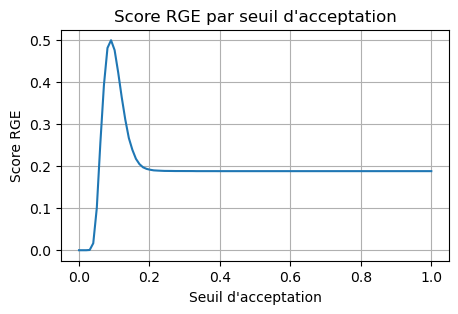

In [72]:
apply_random_forest(data_standard, "standard", preprocessing_times, results)

--- RandomForest (oversampling) ---
Score AUROC (train) : 0.77009
Score AUROC (test) : 0.70649
Seuil d'acceptation : 0.51
Score RGE (train) : 0.45718
Score RGE (test) : 0.37652


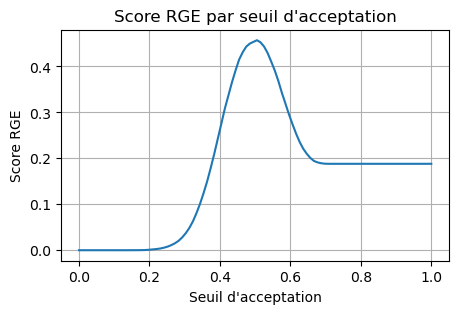

In [73]:
apply_random_forest(data_over, "oversampling", preprocessing_times, results)

--- RandomForest (undersampling) ---
Score AUROC (train) : 0.76469
Score AUROC (test) : 0.71666
Seuil d'acceptation : 0.52
Score RGE (train) : 0.43321
Score RGE (test) : 0.3876


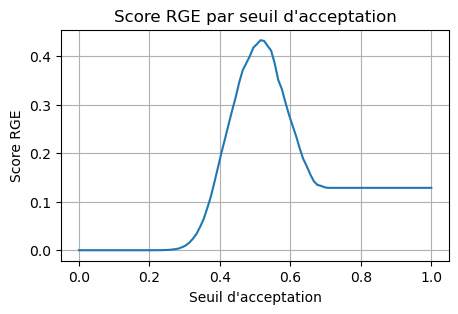

In [74]:
apply_random_forest(data_under, "undersampling", preprocessing_times, results)

--- RandomForest (smote) ---
Score AUROC (train) : 0.68134
Score AUROC (test) : 0.65616
Seuil d'acceptation : 0.39
Score RGE (train) : 0.33661
Score RGE (test) : 0.31302


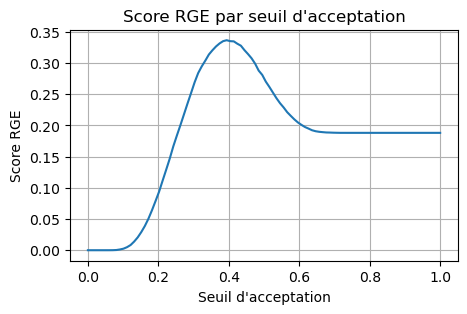

In [75]:
apply_random_forest(data_smote, "smote", preprocessing_times, results)

## Gradient Boosting

In [76]:
def light_gbm_builder(params) :
    
    base_params = {
        "boosting_type": "gbdt",
        "objective": "binary",
        "n_estimators" : 100,
        "verbose" : -1,
        "random_state" : 42
    }
    
    return LGBMClassifier(**base_params, **params)

In [77]:
def apply_light_gbm(data, balancing, preprocessing_times, results) :

    params = {
        "num_leaves" : 30,
        "learning_rate" : 0.05,
        "feature_fraction" : 0.9,
        "bagging_fraction" : 0.8, 
        "bagging_freq" : 5
    }
        
    lgbm_clf = light_gbm_builder(params)
    preds, training_time, prediction_time = apply_classifier(data, lgbm_clf)

    print(f"--- RandomForest ({balancing}) ---")
    metrics = evaluate_preds(data, preds, display_curve = True)

    metrics["preprocessing_time"] = preprocessing_times[balancing]
    metrics["training_time"] = training_time
    metrics["prediction_time"] = prediction_time

    new_row = {
        "name" : "light_gbm",
        "classifier" : lgbm_clf,
        "balancing" : balancing,
        "acceptance" : preds["acceptance"]
    }

    for (metric, value) in metrics.items() :
        new_row[metric] = value
    
    results.append(new_row)

    if MLFLOW :
        params = {"balancing" : balancing, "acceptance" : preds["acceptance"]}
        mlflow_save_results(f"Light GBM ({balancing})", params = params, metrics = metrics)

--- RandomForest (standard) ---
Score AUROC (train) : 0.78084
Score AUROC (test) : 0.76258
Seuil d'acceptation : 0.09
Score RGE (train) : 0.47322
Score RGE (test) : 0.45039


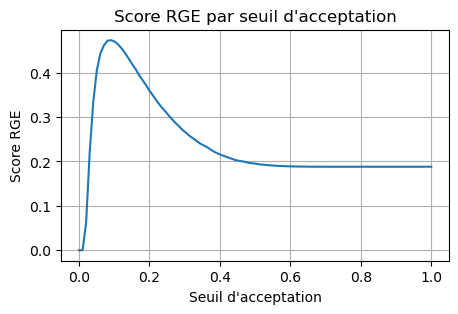

In [78]:
apply_light_gbm(data_standard, "standard", preprocessing_times, results)

--- RandomForest (oversampling) ---
Score AUROC (train) : 0.77969
Score AUROC (test) : 0.76348
Seuil d'acceptation : 0.52
Score RGE (train) : 0.46872
Score RGE (test) : 0.45256


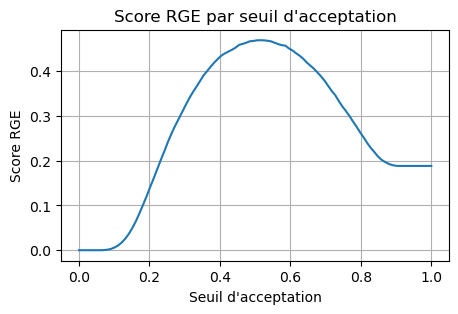

In [79]:
apply_light_gbm(data_over, "oversampling", preprocessing_times, results)

--- RandomForest (undersampling) ---
Score AUROC (train) : 0.77647
Score AUROC (test) : 0.7618
Seuil d'acceptation : 0.48
Score RGE (train) : 0.44483
Score RGE (test) : 0.44933


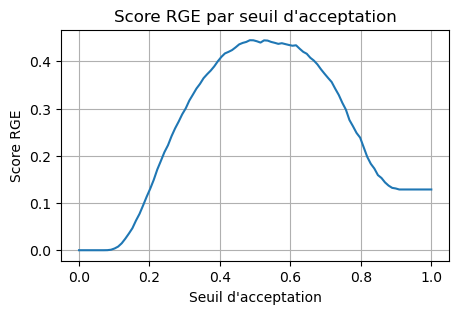

In [80]:
apply_light_gbm(data_under, "undersampling", preprocessing_times, results)

--- RandomForest (smote) ---
Score AUROC (train) : 0.74391
Score AUROC (test) : 0.7378
Seuil d'acceptation : 0.13
Score RGE (train) : 0.42133
Score RGE (test) : 0.41887


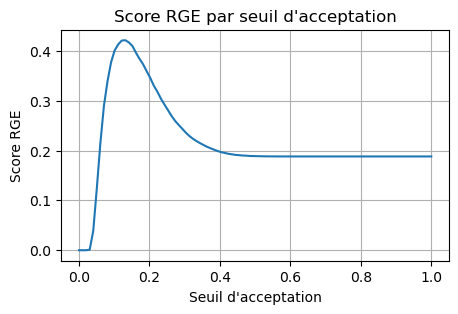

In [81]:
apply_light_gbm(data_smote, "smote", preprocessing_times, results)

## Recherche d'hyperparamètres

In [82]:
def preprocess_folds(X, y, strategy = strategy, n_folds = 5, stratify = True, verbose = 1) :
    
    if stratify :
        folds = StratifiedKFold(n_splits = n_folds, shuffle = True, random_state = 42)
    else :
        folds = KFold(n_splits = n_folds, shuffle = True, random_state = 42)
    
    folds_data = []
    
    for fold, (train_index, valid_index) in enumerate(folds.split(X, y)) :
        
        if verbose > 0 :
            print(f"Prétraitement du fold {fold + 1}/{n_folds}.")
            
        X_train, X_valid = X.loc[train_index], X.loc[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        
        for df in [X_train, X_valid, y_train, y_valid] :
            df.reset_index(drop = True, inplace = True)
        
        temp_train = X_train.assign(**{"TARGET" : y_train})
        temp_valid = X_valid.assign(**{"TARGET" : y_valid})
        processed_data = preprocess_data(temp_train, temp_valid, list(X_train.columns))
        balanced_data = balance_data(processed_data, strategy = strategy)
        folds_data.append(balanced_data)
    
    return folds_data

In [83]:
def cross_validation(folds_data, classifier, verbose = 2) :
    
    scores = []
    
    for fold, data in enumerate(folds_data) :
        
        preds = apply_classifier(data, classifier)
        metrics = evaluate_preds(data, preds, display_results = False)
        rge = metrics["rge_test"]
        scores.append(rge)

        if verbose > 1 :
            print("Score RGE sur le fold ", fold + 1, "/", len(folds_data), " : ", round(rge, 5), sep = "")

    scores.insert(0, np.mean(scores))
    
    if verbose > 0 :
        print("Score RGE moyen : ", round(scores[0], 5))

    return scores

In [84]:
def grid_search(folds_data, classifier_builder, param_grid, verbose = 1) :

    param_combinations = [dict(zip(param_grid.keys(), value)) for value in product(*param_grid.values())]
    
    if verbose > 0 :
        print("Lancement de la grille de recherche sur", len(param_combinations), "jeux de paramètres...")

    best_score = float("-inf")
    best_params = None

    for step, params in enumerate(param_combinations) :
        
        if verbose > 0 :
            print("Etape ", step + 1, "/", len(param_combinations), sep = "")
        
        if verbose > 1 :
            print(params, sep = "")
        
        classifier = classifier_builder(params)
        scores = cross_validation(folds_data, classifier, verbose = 1)
        
        if scores[0] > best_score :
            best_params = params
            best_score = scores[0]
    
    if verbose > 0 :
        print("\nGrille de recherche terminée.")
        print("best_score :", best_score)
        print("best_params :", best_params)
            
    return best_params, best_score

In [85]:
if GRID_SEARCH :
    
    param_grid = {
        "num_leaves" : [15, 20, 25],
        "learning_rate" : [0.05, 0.1, 0.2],
        "feature_fraction" : [0.8, 0.9],
        "bagging_fraction" : [0.7, 0.8],
        "bagging_freq" : [4, 5],
    }
    
    X = df_train.drop(columns = ["SK_ID_CURR", "TARGET"])
    y = df_train["TARGET"].copy()
    
    gc.collect()
    
    start_time = time.time()
    folds_data = preprocess_folds(X, y, strategy = "over")
    print("Prétraitement des folds :", time.time() - start_time, "seconde(s)")
    
    start_time = time.time()
    best_params, best_score = grid_search(folds_data, light_gbm_builder, param_grid)
    print("\nTemps de recherche :", time.time() - start_time, "seconde(s)")

# Conclusion

## Tableau comparatif

--- Light GBM (oversampling) ---
Score AUROC (train) : 0.78597
Score AUROC (test) : 0.76777
Seuil d'acceptation : 0.53
Score RGE (train) : 0.47686
Score RGE (test) : 0.45758


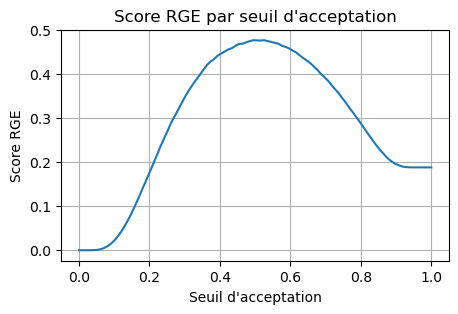

In [86]:
if not GRID_SEARCH :
    best_params = {
        "num_leaves" : 20,
        "learning_rate" : 0.1,
        "feature_fraction" : 0.9,
        "bagging_fraction" : 0.8,
        "bagging_freq": 4
    }

best_model_clf = light_gbm_builder(best_params)

preds, training_time, prediction_time = apply_classifier(data_over, best_model_clf)

print("--- Light GBM (oversampling) ---")
metrics = evaluate_preds(data_over, preds, display_curve = True)

metrics["preprocessing_time"] = preprocessing_times["oversampling"]
metrics["training_time"] = training_time
metrics["prediction_time"] = prediction_time

new_row = {
    "name" : "best_model",
    "classifier" : best_model_clf,
    "balancing" : "oversampling",
    "acceptance" : preds["acceptance"]
}

for (metric, value) in metrics.items() :
    new_row[metric] = value
    
results.append(new_row)

if MLFLOW :
    params = {"balancing" : "oversampling", "acceptance" : preds["acceptance"]}
    mlflow_save_results(f"Best Model", params = params, metrics = metrics)

In [87]:
temp = []
for row in results:
    temp.append({key : value for (key, value) in row.items() if key != "classifier"})
    
for row in temp :
    for column in row :
        if column == "acceptance" or column.endswith("time") :
            row[column] = round(row[column], 3)
        elif not isinstance(row[column], str) :
            row[column] = round(row[column], 5)

pd.DataFrame(temp)

,name,balancing,acceptance,auroc_train,auroc_test,rge_train,rge_test,preprocessing_time,training_time,prediction_time
0,logistic_regression,standard,0.091,0.74831,0.74869,0.42781,0.43241,8.544,5.083,6.783
1,logistic_regression,oversampling,0.556,0.74911,0.74902,0.42808,0.43010,10.514,8.926,7.456
2,logistic_regression,undersampling,0.505,0.74770,0.74811,0.40732,0.43057,8.924,0.735,1.940
3,logistic_regression,smote,0.556,0.74351,0.74585,0.42149,0.42605,14.503,9.553,7.087
4,random_forest,standard,0.091,0.79071,0.71491,0.49960,0.39873,8.544,21.283,11.153
5,random_forest,oversampling,0.505,0.77009,0.70649,0.45718,0.37652,10.514,34.349,12.107
6,random_forest,undersampling,0.515,0.76469,0.71666,0.43321,0.38760,8.924,3.666,6.106
7,random_forest,smote,0.394,0.68134,0.65616,0.33661,0.31302,14.503,75.733,14.293
8,light_gbm,standard,0.091,0.78084,0.76258,0.47322,0.45039,8.544,4.202,7.054
9,light_gbm,oversampling,0.515,0.77969,0.76348,0.46872,0.45256,10.514,7.891,8.104


## Exportations

In [88]:
app_test_encoded["DAYS_EMPLOYED_ANOM"] = (app_test_encoded["DAYS_EMPLOYED"] > 40000)

for feature in only_negative :
    app_test_encoded[feature] *= -1
    
app_test_encoded = create_ratios(app_test_encoded)

for column in app_test_encoded.columns :
        if app_test_encoded[column].dtype in ["int32", "bool"] :
            app_test_encoded[column] = app_test_encoded[column].astype("int64")
            
app_test_encoded.columns = [clean_column_names(column) for column in app_test_encoded.columns]

In [89]:
test_sample = app_test_encoded.sample(n = 1000, random_state = 42).reset_index(drop = True)
test_sample.to_csv("../interface/data.csv", index = False)

In [91]:
selected_features = list(df_train.columns)
selected_features.remove("TARGET")
selected_features.remove("SK_ID_CURR")

full_train = pd.concat([df_train, df_test], ignore_index = True)
test_sample["TARGET"] = np.nan
processed_data = preprocess_data(full_train, test_sample, selected_features)

balanced_data = {
    "standard" : balance_data(processed_data),
    "oversampling" : balance_data(processed_data, strategy = "over"),
    "undersampling" : balance_data(processed_data, strategy = "under"),
    "smote" : balance_data(processed_data, strategy = "smote")
}

balanced_data["oversampling"]["X_train"].to_csv("../app/data.csv", index = False)

#del full_train, app_test_encoded, test_sample, processed_data

In [92]:
with open("../models/acceptance.txt", "w") as txt_file :

    for model in results :

        preds = apply_classifier(balanced_data[model["balancing"]], model["classifier"])

        if model["name"] == "best_model":
            file_path = "../models/best_model.pkl"
        else:
            file_path = f"../models/{model['name']}_{model['balancing']}.pkl"

        txt_file.write(f"{file_path} : {model['acceptance']}\n")
        
                
        with open(file_path, "wb") as pkl_file :
            pickle.dump(model["classifier"], pkl_file)
            
#del processed_data, balanced_data

## Importance des features

In [93]:
def plot_feature_importances(df, max_display, title) :
    
    df = df.sort_values("importance", ascending = False).reset_index()
    df["importance_normalized"] = df["importance"] / df["importance"].sum()

    plt.figure(figsize = (6, 4))
    ax = plt.subplot()
    
    ax.barh(list(reversed(list(df.index[:max_display]))), 
            df["importance_normalized"].head(max_display), 
            align = "center",
            edgecolor = "k")
    
    ax.set_yticks(list(reversed(list(df.index[:max_display]))))
    ax.set_yticklabels(df["feature"].head(max_display))
    ax.tick_params(axis = "y", labelsize = 8)
    
    plt.xlabel("Importance normalisée")
    plt.title(title, size = 14)
    plt.show()
    
    return df.drop(columns = ["index"])

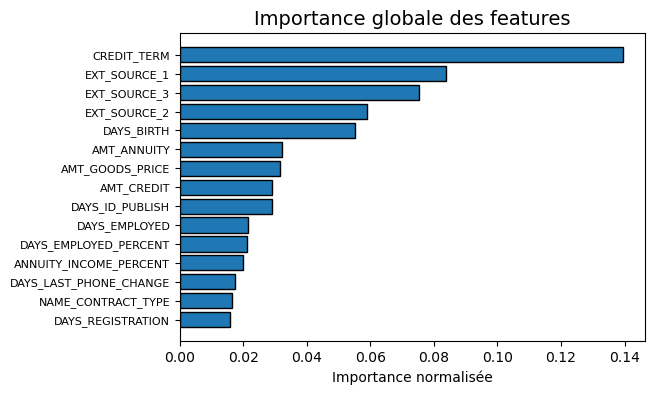

In [96]:
feature_importances = pd.DataFrame({
        "feature" : list(data_standard["X_train"].columns),
        "importance" : best_model_clf.feature_importances_
    })

title = "Importance globale des features"
feature_importances_sorted = plot_feature_importances(feature_importances, 15, title)

In [97]:
def plot_shap_waterfall(classifier, X_test, row_index, title = None, max_display = 10) :

    explainer = shap.Explainer(classifier)
    shap_values = explainer(X_test)
    
    waterfall = shap.plots.waterfall(shap_values[row_index, :, 0], max_display = max_display, show = False)
    waterfall.set_size_inches(12, 8)
    
    if title is None :
        title = f"Importance des features pour la ligne {row_index}"
    
    plt.title(title, size = 20)
    plt.show()

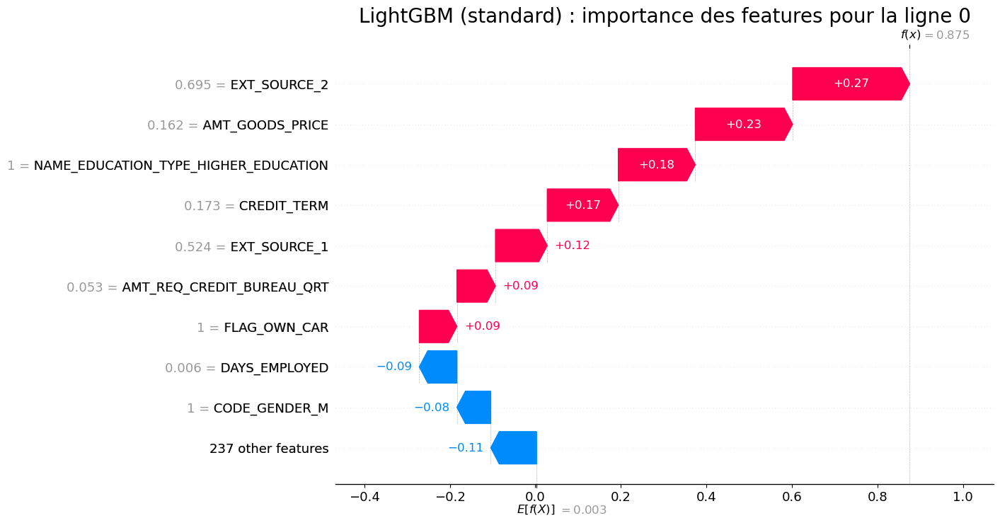

In [98]:
row_index = 0

title = f"LightGBM (standard) : importance des features pour la ligne {row_index}"
plot_shap_waterfall(best_model_clf, data_standard["X_test"], row_index, title)

## Détection du datadrift

In [99]:
reference = df_train.sample(n = 5000, replace = False)
current = df_train.sample(n = 5000, replace = False)

report = Report(metrics = [DataDriftPreset()])
report.run(reference_data = reference, current_data = current)

report.save_html("..\data_drift_report.html")

display(report)